In [35]:
import pandas as pd 
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium.plugins import HeatMap

In [36]:
# ACE Violations from 2024 June 20 12:00:00 AM to 2024 Sep 10 11:45:00 PM
df = pd.read_csv("Datasets/ACE_Violations_PreConj.csv")
df_speeds = pd.read_csv("Datasets/BusSpeeds2024.csv")

In [37]:
print(df.head(3))

   Violation ID                                         Vehicle ID  \
0     439112100  5f773a5cfa5bc89dd4bcbb7be2e0d3c6e7e75a4b429a02...   
1     439091039  851a2658afea97e8391d8a84e3fc32f1f960b7c2f4b08b...   
2     439090735  c78b6fce735da8a93ee2fd1be1a22a217062a49038fa2a...   

         First Occurrence         Last Occurrence  Violation Status  \
0  09/10/2024 04:53:21 PM  09/10/2024 05:07:30 PM  VIOLATION ISSUED   
1  09/08/2024 12:16:49 PM  09/08/2024 12:28:48 PM  VIOLATION ISSUED   
2  09/05/2024 11:04:44 AM  09/05/2024 11:10:46 AM  VIOLATION ISSUED   

         Violation Type Bus Route ID  Violation Latitude  Violation Longitude  \
0       MOBILE BUS LANE          B42           40.644057           -73.901120   
1  MOBILE DOUBLE PARKED        BX41+           40.868074           -73.882293   
2  MOBILE DOUBLE PARKED        BX41+           40.867782           -73.882740   

   Stop ID                     Stop Name  Bus Stop Latitude  \
0   308106  ROCKAWAY PKWY/TRUCKLEMANS LN      

In [38]:
# Convert violations DataFrame → GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["Violation Longitude"], df["Violation Latitude"]),
    crs="EPSG:4326"  # Tells geopandas how coordinates interperted on earth
)

In [39]:
# Loading in the boundaries for congestion zone in Central Business District
region = gpd.read_file("map.geojson")

In [40]:
# Getting the violations that are in congestion zone only
violations_in_region = gpd.sjoin(gdf, region, how="inner", predicate="within")

In [41]:
# Printing the basic information we can gather from this dataset
unique_buses = violations_in_region["Bus Route ID"].unique()
print("Total violations in dataset:", len(df))
print("Violations inside region:", len(violations_in_region))
print("Buses with violations in CBD:", unique_buses)
for bus in unique_buses:
    bus_violations = violations_in_region[violations_in_region["Bus Route ID"] == bus]
    print(f"Total violations on {bus} route: {len(bus_violations)}")

Total violations in dataset: 237969
Violations inside region: 17622
Buses with violations in CBD: ['M14+' 'M15+' 'M23+' 'M34+']
Total violations on M14+ route: 2811
Total violations on M15+ route: 12001
Total violations on M23+ route: 1065
Total violations on M34+ route: 1745


In [42]:
import folium

# Get the center of the region to focus the map
center_lat = violations_in_region["Violation Latitude"].mean()
center_lon = violations_in_region["Violation Longitude"].mean()

# Create a folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Add polygon boundary (CBD)
folium.GeoJson("map.geojson", name="CBD").add_to(m)

# Add violations as points
for idx, row in violations_in_region.iterrows():
    folium.CircleMarker(
        location=[row["Violation Latitude"], row["Violation Longitude"]],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.5
    ).add_to(m)

# Display map
m

In [43]:
from folium.plugins import HeatMap

# List of specific Route IDs to map
selected_routes = ['M15+', 'M14+', 'M34+', 'M23+']

# Filter the violations for only the selected routes
violations_selected = violations_in_region[violations_in_region["Bus Route ID"].isin(selected_routes)]

# Get the center of the region
center_lat = violations_selected["Violation Latitude"].mean()
center_lon = violations_selected["Violation Longitude"].mean()

# Create a folium map
m_heat = folium.Map(location=[center_lat, center_lon], zoom_start=14)

# Add polygon boundary (CBD)
folium.GeoJson("map.geojson", name="CBD").add_to(m_heat)

# Prepare data for heatmap: list of [lat, lon] pairs
heat_data = violations_selected[['Violation Latitude', 'Violation Longitude']].values.tolist()

# Add heatmap layer
HeatMap(heat_data, radius=10, blur=15, max_zoom=15).add_to(m_heat)

# Display map
m_heat

/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71779/1065372692.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=violations_in_region, x="Hour", palette="viridis")


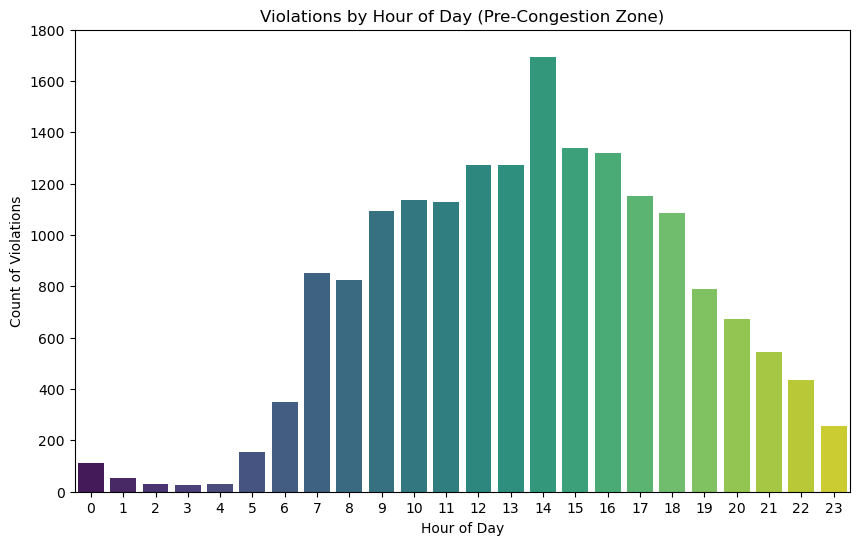

In [44]:
# Convert First Occurrence column to datetime
violations_in_region["First Occurrence"] = pd.to_datetime(
    violations_in_region["First Occurrence"], errors="coerce"
)

# Extract hour
violations_in_region["Hour"] = violations_in_region["First Occurrence"].dt.hour

# Now plot by hour
plt.figure(figsize=(10,6))
sns.countplot(data=violations_in_region, x="Hour", palette="viridis")
plt.title("Violations by Hour of Day (Pre-Congestion Zone)")
plt.xlabel("Hour of Day")
plt.ylabel("Count of Violations")

# Force y-axis limit to match 2024 max (adjust value as needed)
plt.ylim(0, 1800)

plt.show()


/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71779/862776742.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


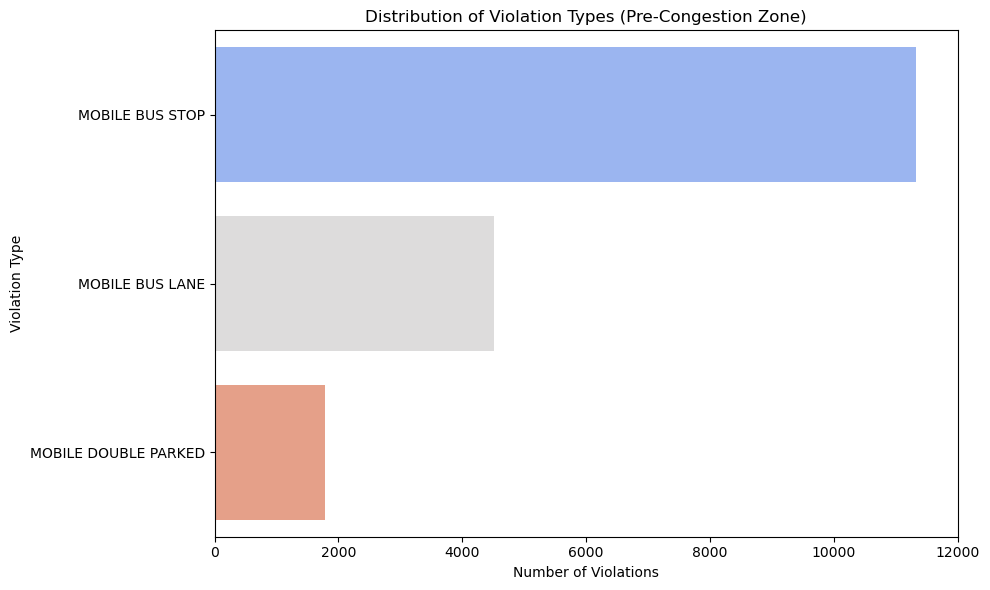

In [45]:
plt.figure(figsize=(10,6))
sns.countplot(
    data=violations_in_region,
    y="Violation Type",
    order=violations_in_region["Violation Type"].value_counts().index,
    palette="coolwarm"
)
plt.title("Distribution of Violation Types (Pre-Congestion Zone)")
plt.xlabel("Number of Violations")
plt.ylabel("Violation Type")

# Force x-axis cap at 12,000
plt.xlim(0, 12000)

plt.tight_layout()
plt.show()


/var/folders/7x/g0b45n8x1y542ly4zwlfn1xc0000gn/T/ipykernel_71779/1671708316.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rate, x="Route ID", y="Violations per 1000 Trips", palette="plasma")


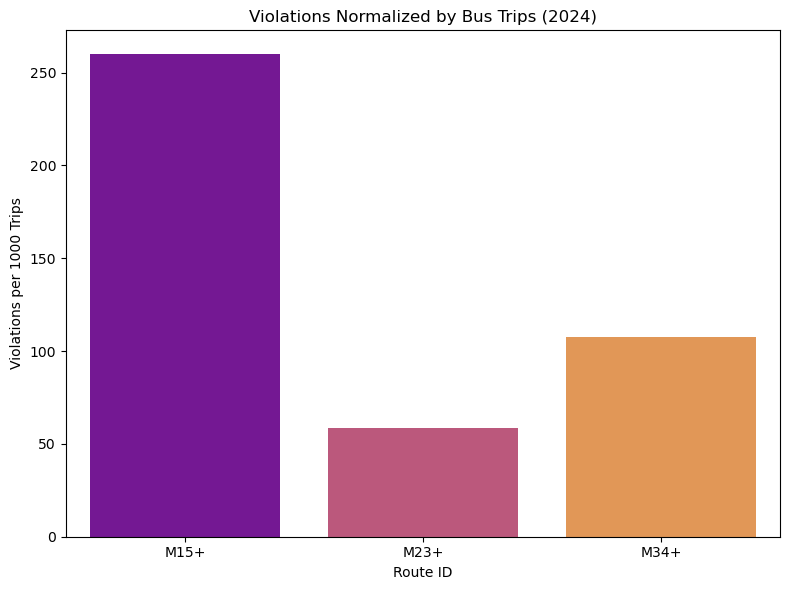

In [46]:
# Calculate violations per trip
trips = df_speeds.groupby("Route ID")["Bus Trip Count"].sum().reset_index()
violations = violations_in_region.groupby("Bus Route ID").size().reset_index(name="Violations")
rate = pd.merge(trips, violations, left_on="Route ID", right_on="Bus Route ID")
rate["Violations per 1000 Trips"] = rate["Violations"] / rate["Bus Trip Count"] * 1000

plt.figure(figsize=(8,6))
sns.barplot(data=rate, x="Route ID", y="Violations per 1000 Trips", palette="plasma")
plt.title("Violations Normalized by Bus Trips (2024)")
plt.ylabel("Violations per 1000 Trips")
plt.tight_layout()
plt.show()


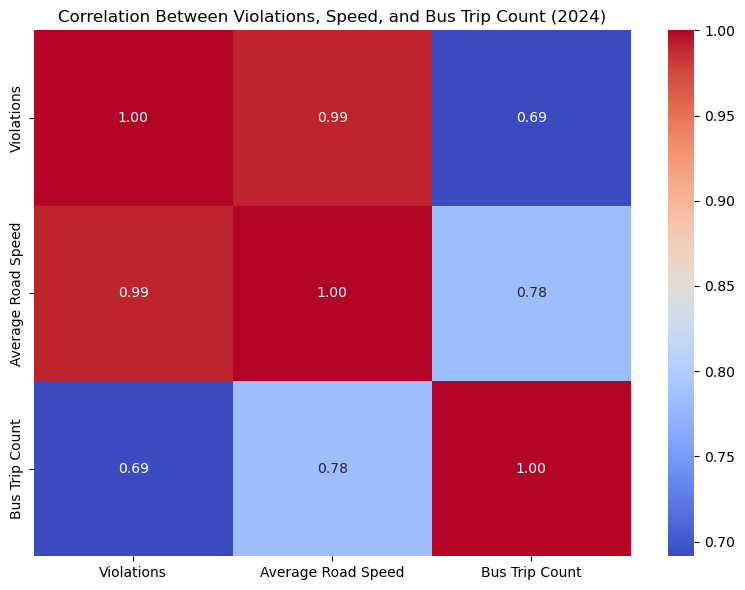

In [47]:
# First, aggregate violations by Route ID
violations_count = violations_in_region.groupby("Bus Route ID").size().reset_index(name="Violations")

# Average speed and trip count by Route ID for 2024
speed_summary = df_speeds.groupby("Route ID")[["Average Road Speed", "Bus Trip Count"]].mean().reset_index()

# Merge datasets
summary_df = violations_count.merge(speed_summary, left_on="Bus Route ID", right_on="Route ID")

# Drop Route ID column for correlation
corr_df = summary_df.drop(columns=["Bus Route ID", "Route ID"])

plt.figure(figsize=(8,6))
sns.heatmap(
    corr_df.corr(), 
    annot=True, 
    cmap="coolwarm", 
    fmt=".2f"
)
plt.title("Correlation Between Violations, Speed, and Bus Trip Count (2024)")
plt.tight_layout()
plt.show()